In [14]:
import json
import pandas as pd
from collections import defaultdict, Counter
import matplotlib.pyplot as plt
import ast

In [2]:
same_word_sentences = {
  0: ["She deposited her paycheck at the bank this morning.", "The children played with toys at the bank.", "The bank where she works is closed today.", "We stopped by the bank to make a deposit."],
  1: ["The baby giggled as she rolled the toy across the floor.", "He enjoyed playing with his new toy truck.", "He stepped on a toy and tripped.", "The toy store was having a big sale."],
  2: ["His ultimate goal is to win the race.", "Scoring a goal in overtime won them the championship.", "She set a goal to improve her grades.", "They scored three goals in the first half."],
  3: ["Tomorrow is my birthday.", "It is going to be cold today so wear a jacket.", "Today is Friday.", "The weather is supposed to be nice this weekend."],
  4: ["Her work schedule is very demanding.", "I have a lot of work to do this weekend.", "He is at work right now.", "She works two jobs to pay the bills."],
  5: ["We played catch with the ball.", "The quarterback threw a perfect spiral ball down the field.", "The ball bounced off the rim.", "He kicked the ball into the goal."],
  6: ["She got a burn from the hot slide.", "The children laughed as they went down the slide.", "The playground had a really tall slide.", "He went down the slide head first."],
  7: ["It was an amazing trip.", "They are going on a trip to the beach next month.", "She tripped on the stairs.", "The field trip to the museum was fun."],
  8: ["He had a bad day at work.", "This food tastes really bad.", "The weather was bad so we stayed inside.", "That was a bad mistake."],
  9: ["You did a great job!", "I feel great now that I'm done with that project.", "That was a great movie.", "She's a great friend."],
  10: ["I would like to eat there again soon.", "I really like eating at that restaurant.", "Do you like horror movies?", "Her nails look like those of a monster."],
  11: ["The quarterback threw to the receiver.", "The receiver jumped high in the air to make the catch.", "He's a talented receiver.", "The receiver caught the ball and scored."],
  12: ["They crowned him king after the war.", "The king ruled over the kingdom justly.", "We learned about King Arthur and the Knights of the Round Table.", "The king lived in a grand castle."],
  13: ["He was hired by the CIA.", "Agents from the CIA were on a secret mission.", "The CIA uncovered the plot.", "She worked for the CIA for 20 years."],
  14: ["The view from the mountaintop was marvelous.", "Her home decorated so marvelously for the holidays.", "You look marvelous in that dress.", "He did a marvelous job on the presentation."],
  15: ["You have the right to bear arms.", "We saw a bear while hiking through the woods.", "He has a tattoo of a bear on his arm.", "To bear witness to injustice is to tell a story about our world based upon firsthand observation of real-life circumstance."],
  16: ["The team celebrated their champion quarterback's leadership.", "As the champion, he gave a speech at the ceremony.", "She was the champion for 5 years in a row.", "You have always been a champion of the people."],
  17: ["I need to charge my phone.", "You can call me on my phone when you arrive.", "You will sing thr national anthem, don't phone it in!", "I will phone the bank now"],
  18: ["We smelled smoke and called the fire department.", "There was a lot of smoke coming from the chimney.", "The fire was sending up plumes of black smoke.", "To smoke is to slowly kill yourself."],
  19: ["Stop it or the curtains will catch fire!", "Nice catch! You made it look easy.", "We tried to catch butterflies in the field.", "I don't trust you, what's the catch, ."]
}

same_word_sentence_indices = {0: 'bank',1: 'toy', 2: 'goal', 3: 'is', 4: 'work', 5: 'ball', 6: 'slide', 7: 'trip', 8: 'bad', 9: 'great', 10: 'like', 11: 'receiver', 12: 'king', 13: 'CIA', 14: 'marvelous', 15: 'bear', 16: 'champion', 17: 'phone', 18: 'smoke', 19: 'catch'}

indices_in_sentences = defaultdict(list,
            {0: [34, 37, 4, 18],
             1: [35, 32, 16, 4],
             2: [13, 10, 10, 18],
             3: [9, 3, 6, 12],
             4: [4, 16, 9, 4],
             5: [25, 39, 4, 14],
             6: [28, 43, 33, 17],
             7: [18, 20, 4, 10],
             8: [9, 24, 16, 11],
             9: [10, 7, 11, 8],
             10: [8, 9, 7, 15],
             11: [29, 4, 16, 4],
             12: [17, 4, 17, 4],
             13: [20, 16, 4, 19],
             14: [34, 22, 9, 9],
             15: [22, 9, 21, 3],
             16: [26, 7, 12, 23],
             17: [20, 22, 41, 7],
             18: [11, 19, 40, 3],
             19: [29, 5, 12, 30]})


In [3]:
# find near neighbor 50 words in the embedding space 

close_word_sentences = {
  "1": ["The king ruled the kingdom wisely.", "The queen ruled the kingdom wisely.", "The emperor ruled the kingdom wisely.", "The empress ruled the kingdom wisely."],
  "2": ["The uncle took the kids to the zoo.", "The aunt took the kids to the zoo.", "The father took the kids to the zoo.", "The mother took the kids to the zoo."],
  "3": ["The gentleman held the door open for her.", "The lady held the door open for her.", "The man held the door open for her.", "The woman held the door open for her."],
  "4": ["The brother played video games all day.", "The sister played video games all day.", "The boy played video games all day.", "The girl played video games all day."],
  "5": ["The grandfather told stories about his childhood.", "The grandmother told stories about her childhood.", "The grandpa told stories about his childhood.", "The grandma told stories about her childhood."],
  "6": ["The nephew asked for money for his birthday.", "The niece asked for money for her birthday.", "The grandson asked for money for his birthday.", "The granddaughter asked for money for her birthday."],
  "7": ["The prince searched for a princess to marry.", "The princess searched for a prince to marry.", "The bachelor searched for a bachelorette to marry.", "The bachelorette searched for a bachelor to marry."],
  "8": ["The wizard cast a magic spell.", "The witch cast a magic spell.", "The sorcerer cast a magic spell.", "The sorceress cast a magic spell."],
  "9": ["The actor gave an incredible performance.", "The actress gave an incredible performance.", "The male actor gave an incredible performance.", "The female actress gave an incredible performance."],
  "10": ["The guy drove an expensive sports car.", "The gal drove an expensive sports car.", "The man drove an expensive sports car.", "The woman drove an expensive sports car."],
  "11": ["The groom looked handsome in his tuxedo.", "The bride looked beautiful in her wedding dress.", "The husband looked handsome in his tuxedo.", "The wife looked beautiful in her wedding dress."],
  "12": ["The prince lived in the castle.", "The princess lived in the castle.", "The prince lived in the palace.", "The princess lived in the palace."],
  "13": ["The father built a treehouse for the kids.", "The mother built a treehouse for the kids.", "The dad built a treehouse for the kids.", "The mom built a treehouse for the kids."],
  "14": ["The husband cleaned the dishes after dinner.", "The wife cleaned the dishes after dinner.", "The man cleaned the dishes after dinner.", "The woman cleaned the dishes after dinner."],
  "15": ["The boy studied hard for the test.", "The girl studied hard for the test.", "The son studied hard for the test.", "The daughter studied hard for the test."],
  "16": ["The male swimmer won first place.", "The female swimmer won first place.", "The man swimmer won first place.", "The woman swimmer won first place."],
  "17": ["The boyscout helped the old lady.", "The girlscout helped the old lady.", "The boyscout helped the elderly woman.", "The girlscout helped the elderly woman."],
  "18": ["The son mowed the lawn yesterday.", "The daughter mowed the lawn yesterday.", "The boy mowed the lawn yesterday.", "The girl mowed the lawn yesterday."],
  "19": ["The man ordered steak for dinner.", "The woman ordered steak for dinner.", "The gentleman ordered steak for dinner.", "The lady ordered steak for dinner."],
  "20": ["The uncle gave great gifts at Christmas.", "The aunt gave great gifts at Christmas.", "The grandfather gave great gifts at Christmas.", "The grandmother gave great gifts at Christmas."]
}

In [70]:
homonym_sentences = {
  "bank": "I went to the bank to withdraw money before heading to the river bank to enjoy the sunset.",
  "bat": "He bought a new bat for baseball, not realizing a bat was sleeping in the corner of the garage.",
  "bark": "The tree's bark was rough against my back as I listened to the dog bark excitedly in the distance.",
  "current": "While studying about electric current, she felt the strong current pull her as she swam.",
  "date": "I checked the calendar to see the date, wondering if my blind date would enjoy dates as a snack.",
  "die": "They used a single die to decide who would go first, not knowing fate would soon cast a darker die.",
  "fine": "After arguing that the weather was fine, he ended up paying a fine for speeding under the clear skies.",
  "lead": "They decided to lead the group, unaware of the health risks posed by the lead piping in the building.",
  "left": "After he left the room, I realized the only piece of cake left was his.",
  "match": "She lit the candle with a match, hoping its glow would match the mood she wanted to set.",
  "mean": "His intentions were mean, but the average (mean) of the numbers was surprisingly high.",
  "mold": "They found mold on the bread in the shape of a mold they had never seen.",
  "mussel": "She pulled a mussel from the net, feeling her muscle strain under the weight.",
  "pitch": "He decided to pitch his idea at a higher pitch to grab everyone's attention.",
  "plain": "She preferred plain yogurt, looking out over the plain, wishing for simpler times.",
  "right": "He turned right into the art gallery, convinced he was in the right place for inspiration.",
  "ring": "He heard a ring at the door, just as he finished polishing the ancient ring.",
  "row": "They had a row about how to row the boat effectively in the race.",
  "sewer": "The tailor complained about the sewer system, fearing it might affect his work in the sewer.",
  "tear": "A tear ran down her cheek as she attempted to tear the heavy paper.",
  "bow": "He took a bow after the performance, holding a bow and arrow in his hand for the next act.",
  "close": "They had to close the shop early to stay close to their family during the holiday.",
  "desert": "He promised he would never desert her, even in the vast desert where they were stranded.",
  "dove": "The dove soared above the water before she dove into the lake.",
  "fair": "He argued it was only fair to pay the entrance fee to the county fair.",
  "gill": "The fisherman checked the gill of the fish before sharing his favorite Gillian Flynn novel.",
  "jam": "She found herself in a traffic jam, realizing she had forgotten her favorite jam at the grocery store.",
  "lie": "It was no lie that she loved to lie in the sun.",
  "minute": "He asked for a minute of her time, not noticing the minute details of her work.",
  "number": "As the cold numbed her fingers, she realized her number was no longer listed.",
  "pound": "He decided to adopt a dog from the pound, feeling the weight of the decision pound in his heart.",
  "ruler": "The ruler of the land had a favorite ruler to measure the progress of his realm.",
  "scale": "The musician played a scale on her guitar, unaware of the fish scale stuck to her shoe.",
  "sole": "The sole of his shoe was worn out, making him the sole participant to finish the marathon barefoot.",
  "stair": "He raced up the stair, staring into the distance.",
  "steal": "He would never steal, even if it was to secure the steel needed for the project.",
  "tail": "The comet's tail was visible in the night sky, just as the cat's tail swept the table clear.",
  "tire": "She didn't tire of the view, even as she changed the tire on her car.",
  "waste": "It was a waste of time to argue, especially in the waste lands of the far north.",
  "wave": "He gave a wave to his friend, not noticing the giant wave approaching from behind.",
  "well": "She wished well for her friends, drawing water from the ancient well.",
  "wind": "The wind was too strong for sailing, making it difficult to wind the clock.",
  "wound": "The wound was deep, inflicted by the sharp wind that wound through the alley.",
  "bear": "He couldn't bear the weight, watching the bear roam through the campsite.",
  "crane": "She had to crane her neck to see the crane lifting materials at the construction site.",
  "draft": "He felt a cold draft in the room while drafting his novel.",
  "engaged": "They were engaged in conversation when he mentioned they had finally got engaged.",
  "lean": "He had to lean against the wall to support his lean figure.",
  "saw": "He saw the art piece in the gallery before deciding to saw the wood for his next project."
}

In [6]:
# Opening JSON file

filenames = ['syntax_gym_all_info_base8_400_pos_tagged.csv', 'close_word_sentences_all_info_base8_80_pos_tagged.csv', 
             'same_word_sentences_all_info_base8_80_pos_tagged.csv', 'homonym_sentences_all_info_base8_50_pos_tagged.json']
f = open(filenames[3])
 
# returns JSON object as 
# a dictionary
data = json.load(f)
 
# Closing file
f.close()


In [17]:
x

{'0': {('▁I', 0, 'PRP'): [[1, 7], [3, 1], [5, 2], [7, 6], [9, 5], [11, 5]],
  ('▁went', 1, 'VBD'): [[1, 4], [3, 4], [5, 1], [7, 6], [9, 1], [11, 6]],
  ('▁to', 2, 'IN'): [[1, 0], [3, 5], [5, 0], [7, 5], [9, 7], [11, 3]],
  ('▁the', 3, 'DT'): [[1, 3], [3, 1], [5, 2], [7, 3], [9, 7], [11, 5]],
  ('▁bank', 4, 'NN'): [[1, 4], [3, 3], [5, 3], [7, 4], [9, 3], [11, 1]],
  ('▁to', 5, 'TO'): [[1, 0], [3, 7], [5, 0], [7, 5], [9, 5], [11, 4]],
  ('▁withdraw', 6, 'VB'): [[1, 6], [3, 4], [5, 0], [7, 6], [9, 7], [11, 2]],
  ('▁money', 7, 'NN'): [[1, 3], [3, 2], [5, 3], [7, 3], [9, 3], [11, 1]],
  ('▁before', 8, 'IN'): [[1, 6], [3, 5], [5, 6], [7, 5], [9, 5], [11, 4]],
  ('▁heading', 9, 'VBG'): [[1, 3], [3, 4], [5, 1], [7, 6], [9, 3], [11, 2]],
  ('▁to', 10, 'IN'): [[1, 0], [3, 5], [5, 0], [7, 5], [9, 7], [11, 3]],
  ('▁the', 11, 'DT'): [[1, 3], [3, 1], [5, 2], [7, 1], [9, 7], [11, 0]],
  ('▁river', 12, 'NN'): [[1, 4], [3, 3], [5, 7], [7, 3], [9, 4], [11, 1]],
  ('▁bank', 13, 'NN'): [[1, 4], [3, 3], 

# Preprocessing

In [26]:
def string_to_tuple(string):
    # Remove parentheses and split by comma and strip quotes
    parts = string.strip("()").split(", ")
    word = parts[0].strip("''")
    index = int(parts[1])
    pos_tag = parts[2].strip("''")
    return word, index, pos_tag

def preprocess(data):
    int_data = {}
    for key, val in data.items():
        new_routes = {}
        int_key = int(key)
        for key2, val2 in val.items():
            new_key = string_to_tuple(key2)
            new_routes[new_key] = val2
        int_data[int_key] = new_routes
    return int_data

In [27]:
int_data = preprocess(data)

# Overall Layer Specs

In [7]:
pos_tag_routes = {}
pos_tag_names = defaultdict(list)

for key, val in int_data.items():
    for inner_key, inner_val in val.items():
        token_name, pos_tag = inner_key[0], inner_key[2]
        if pos_tag not in pos_tag_routes:
            pos_tag_routes[pos_tag] = [[] for _ in range(6)]
        pos_tag_names[pos_tag].append(token_name)
        for i, (step, route) in enumerate(inner_val):
            pos_tag_routes[pos_tag][i].append(route)

In [8]:
pos_tag_counts = defaultdict(list)
for key, val in pos_tag_routes.items():
    for i, array in enumerate(val):
        pos_tag_counts[key].append(Counter(array))

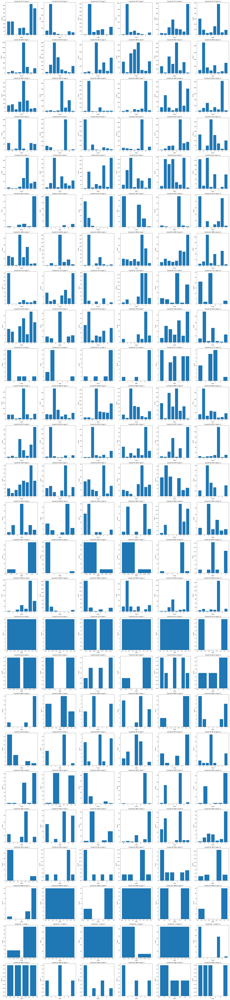

In [89]:
# Determine the layout of the subplot grid
num_pos_tags = len(pos_tag_counts)
num_layers = max(len(layers) for layers in pos_tag_counts.values())
fig, axes = plt.subplots(num_pos_tags, num_layers, figsize=(num_layers * 5, num_pos_tags * 5))

# Check if we have a single row or column to adjust indexing
if num_pos_tags == 1:
    axes = [axes]
if num_layers == 1:
    axes = [[ax] for ax in axes]

# Plot each Counter object
for row_index, (pos_tag, layers) in enumerate(pos_tag_counts.items()):
    for col_index, layer in enumerate(layers):
        # For each layer, get the keys and values for plotting
        keys = list(layer.keys())
        values = list(layer.values())
        ax = axes[row_index][col_index]  # Get the correct subplot
        ax.bar(keys, values)
        ax.set_title(f'Counts for {pos_tag} in layer {col_index*2 + 1}')
        ax.set_xlabel('Index')
        ax.set_ylabel('Count')

# Adjust layout
plt.tight_layout()
plt.show()


# Distribution of experts per index

In [130]:
expert_per_index = defaultdict(lambda: [[] for _ in range(6)])

for key, val in int_data.items():
    for inner_key, inner_val in val.items():
        token_name, token_index, pos_tag = inner_key    
        for i, (step, route) in enumerate(inner_val):
            expert_per_index[token_index][i].append(route)


In [131]:
expert_per_index_counts = defaultdict(list)
for key, val in expert_per_index.items():
    for routes in val:
        expert_per_index_counts[key].append(Counter(routes))

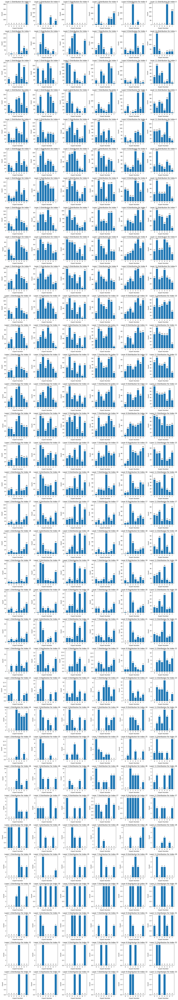

In [133]:
import matplotlib.pyplot as plt
from collections import Counter

num_indices = len(expert_per_index_counts)  # Number of indices
num_layers = 6  # Assuming 6 layers based on your example

# Create a subplot grid with one row per index and one column per layer
fig, axes = plt.subplots(num_indices, num_layers, figsize=(num_layers * 3, num_indices * 3), squeeze=False)

# Iterate over each index and its corresponding list of Counter objects
for index, layers in expert_per_index_counts.items():
    for layer_num, layer_counts in enumerate(layers):
        ax = axes[index][layer_num]  # Accessing the correct subplot

        # Make sure all experts 0-7 are included, even if their counts are 0
        all_experts = {i: 0 for i in range(8)}  # Initialize all experts with 0 count
        all_experts.update(layer_counts)  # Update with actual counts

        # Extract keys and values for plotting
        keys = list(all_experts.keys())
        values = list(all_experts.values())

        # Plot
        bars = ax.bar(keys, values, tick_label=keys)

        # Mark counts above bars
        for bar in bars:
            height = bar.get_height()
            ax.annotate(f'{height}',
                        xy=(bar.get_x() + bar.get_width() / 2, height),
                        xytext=(0, 3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom')

        ax.set_title(f'Layer {layer_num*2 + 1} Distribution for Index {index}')
        ax.set_xlabel('Expert Number')
        ax.set_ylabel('Count')
        ax.set_xticks(range(8))  # Ensure x-ticks for all experts

plt.tight_layout()
plt.show()


# Distribution of Experts for Semantically Similar Words at same indices (Close Word Sentences - 80 samples)

In [7]:
similar_word_groups = defaultdict(list)
for key, values in int_data.items():
    sentence_group = key // 4
    

In [11]:
int_data.values()

dict_values([{('▁The', 0, 'DT'): [[1, 7], [3, 1], [5, 2], [7, 1], [9, 3], [11, 5]], ('▁', 1, 'NN'): [[1, 5], [3, 2], [5, 7], [7, 1], [9, 4], [11, 7]], ('king', 2, 'NN'): [[1, 1], [3, 2], [5, 3], [7, 3], [9, 4], [11, 1]], ('▁', 3, 'VBD'): [[1, 5], [3, 4], [5, 1], [7, 6], [9, 1], [11, 6]], ('ruled', 4, 'VBD'): [[1, 1], [3, 4], [5, 1], [7, 6], [9, 7], [11, 2]], ('▁the', 5, 'DT'): [[1, 6], [3, 1], [5, 7], [7, 1], [9, 7], [11, 0]], ('▁kingdom', 6, 'NN'): [[1, 4], [3, 3], [5, 3], [7, 3], [9, 4], [11, 1]], ('▁wise', 7, 'RB'): [[1, 5], [3, 4], [5, 5], [7, 5], [9, 1], [11, 2]], ('ly', 8, 'RB'): [[1, 2], [3, 5], [5, 4], [7, 5], [9, 6], [11, 4]], ('.', 9, 'RB'): [[1, 2], [3, 7], [5, 2], [7, 7], [9, 2], [11, 7]], ('</s>', 10, 'RB'): [[1, 7], [3, 7], [5, 5], [7, 7], [9, 3], [11, 4]], ('<pad>', 11, 'RB'): [[1, 4], [3, 2], [5, 3], [7, 4], [9, 2], [11, 7]], ('<pad>', 12, 'RB'): [[1, 4], [3, 2], [5, 3], [7, 4], [9, 2], [11, 2]]}, {('▁The', 0, 'DT'): [[1, 7], [3, 1], [5, 2], [7, 1], [9, 3], [11, 5]], ('

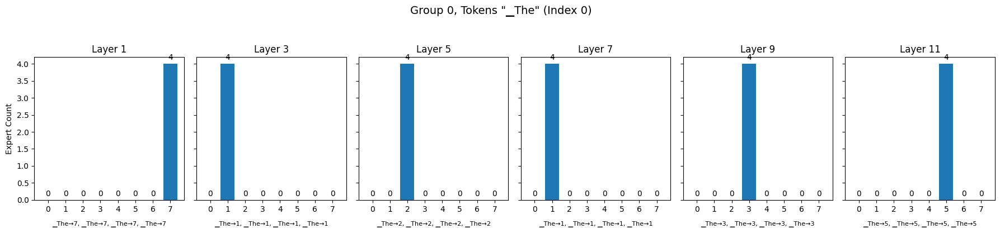

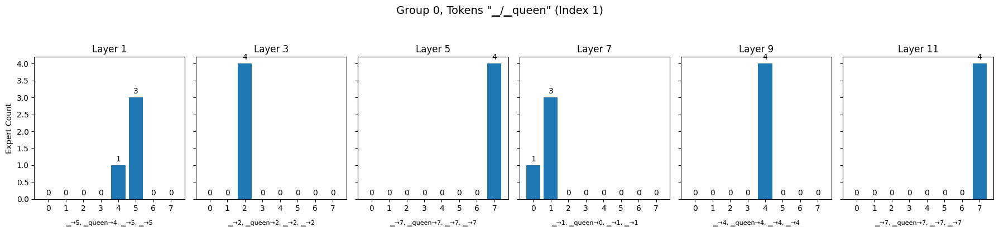

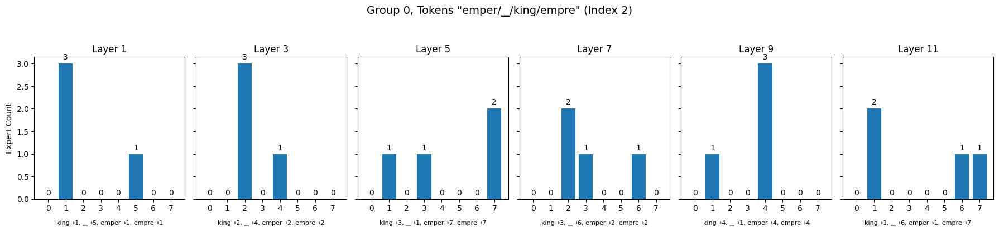

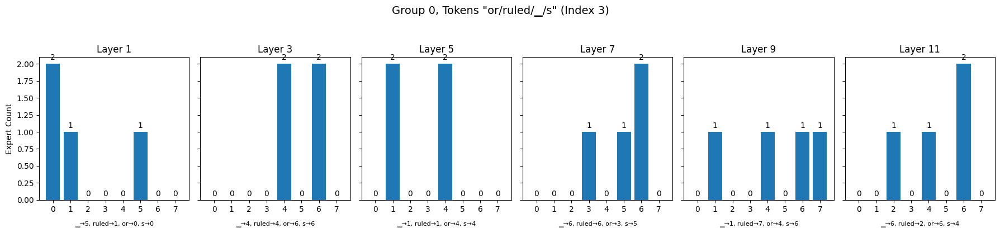

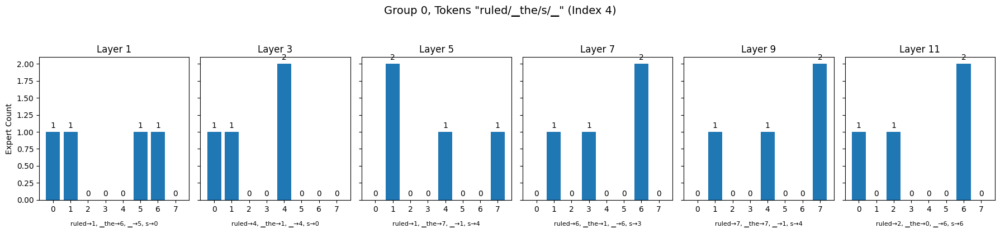

...

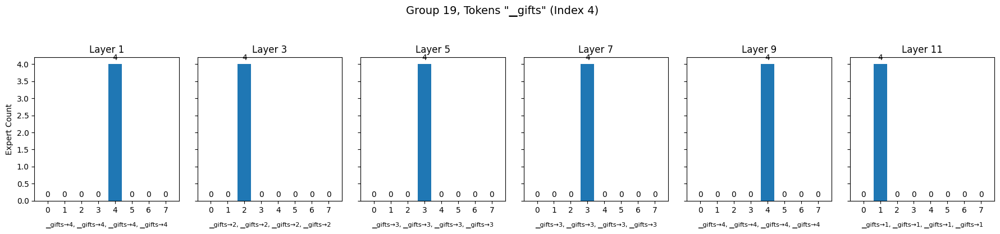

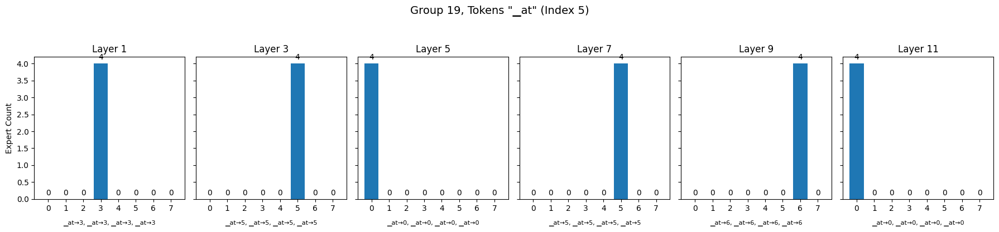

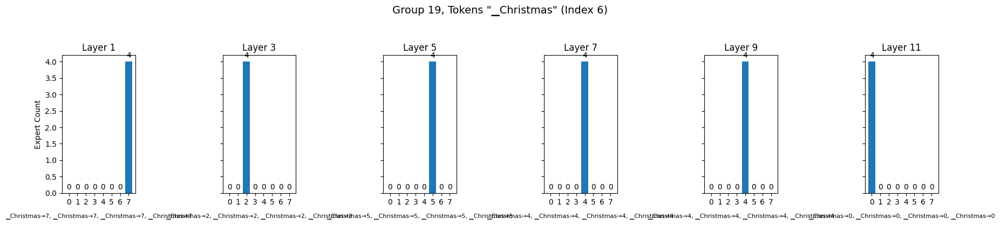

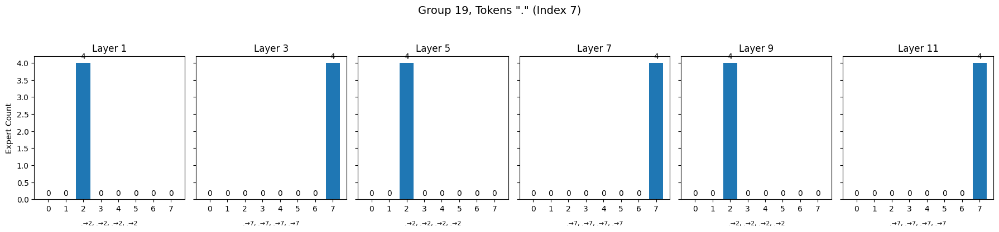

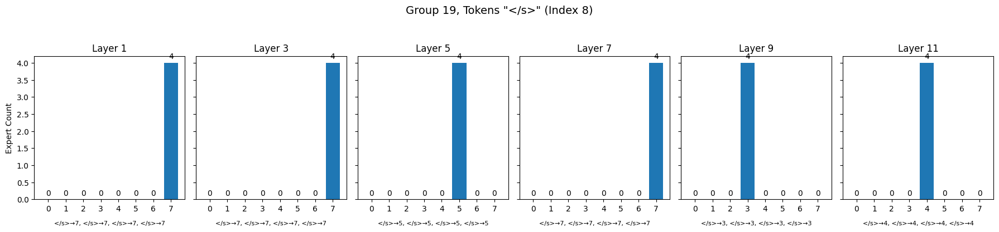

In [20]:
import matplotlib.pyplot as plt
import numpy as np

# Specify the layers to focus on
target_layers = [1, 3, 5, 7, 9, 11]

def plot_expert_distributions(data):
    # Calculate number of sentence groups
    num_sentence_groups = max(data.keys()) // 4 + 1

    for group_idx in range(num_sentence_groups):
        # Select sentences in the current group
        group_data = {k: data[k] for k in range(group_idx * 4, (group_idx + 1) * 4)}
        
        # Find the maximum token index in the group to handle varying sentence lengths
        max_token_index = max(max(key[1] for key in sentence.keys()) for sentence in group_data.values())
        
        for token_idx in range(max_token_index + 1):
            # Collect unique tokens that appear at the same index across the sentences in a group
            unique_tokens = set(token_key[0] for sentence_idx, sentence_data in group_data.items() for token_key in sentence_data.keys() if token_key[1] == token_idx)
            tokens_str = '/'.join(unique_tokens)
            
            # Initialize a matrix to hold the counts of expert choices for the target layers
            expert_counts = np.zeros((len(target_layers), num_experts))
            expert_routes = {layer: [] for layer in target_layers}
            
            for sentence_idx, sentence_data in group_data.items():
                for token_key, expert_choices in sentence_data.items():
                    if token_key[1] == token_idx:  # Match token index
                        for layer_num, expert_index in expert_choices:
                            if layer_num in target_layers:
                                layer_index = target_layers.index(layer_num)
                                expert_counts[layer_index, expert_index] += 1
                                expert_routes[layer_num].append((token_key[0], expert_index))

            # Plotting
            fig, axs = plt.subplots(1, len(target_layers), figsize=(len(target_layers) * 3, 4), sharey=True)
            fig.suptitle(f'Group {group_idx}, Tokens "{tokens_str}" (Index {token_idx})', fontsize=14, y=1.05)
            
            for i, layer in enumerate(target_layers):
                bars = axs[i].bar(range(num_experts), expert_counts[i, :], tick_label=range(num_experts))
                axs[i].set_title(f'Layer {layer}')
                # axs[i].set_xlabel('Expert Index')
                if i == 0:
                    axs[i].set_ylabel('Expert Count')
                
                # Add specific expert routes as annotations
                route_str = ", ".join([f"{token}→{expert}" for token, expert in expert_routes[layer]])
                axs[i].annotate(route_str, xy=(0.5, -0.15), xycoords='axes fraction', ha='center', va='top', fontsize=8)

                # Add count above each bar
                for bar in bars:
                    height = bar.get_height()
                    axs[i].annotate(f'{int(height)}',
                                    xy=(bar.get_x() + bar.get_width() / 2, height),
                                    xytext=(0, 3),  # 3 points vertical offset
                                    textcoords="offset points",
                                    ha='center', va='bottom')

            plt.tight_layout()
            plt.show()

plot_expert_distributions(int_data)


# Same word, different meaning/position (Same word sentences - 80 samples)

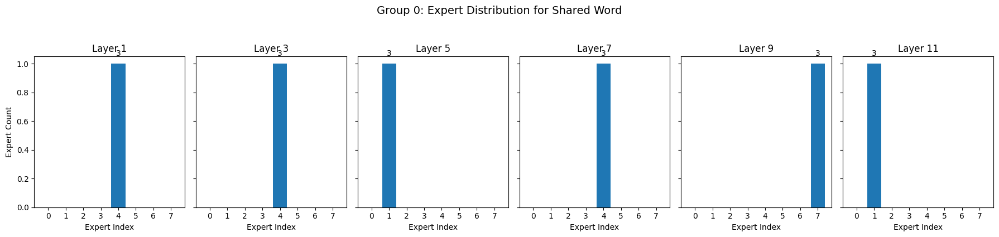

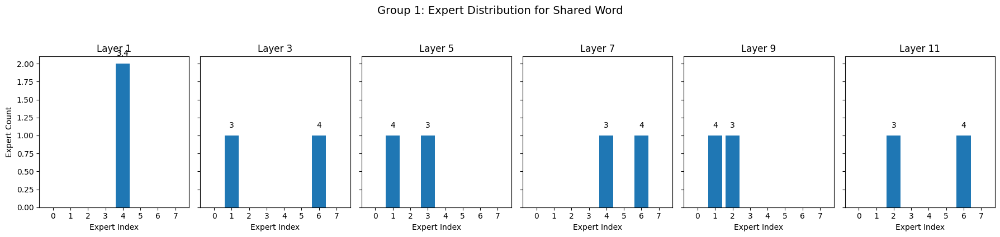

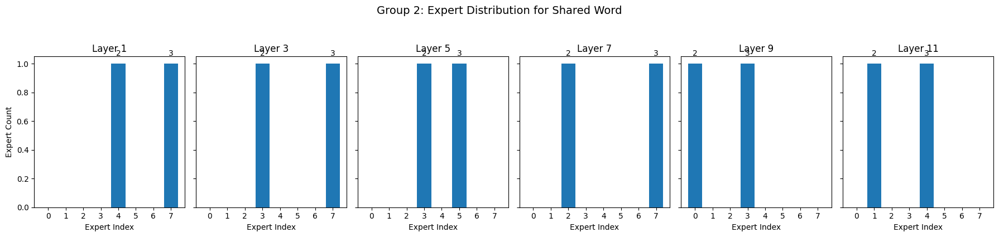

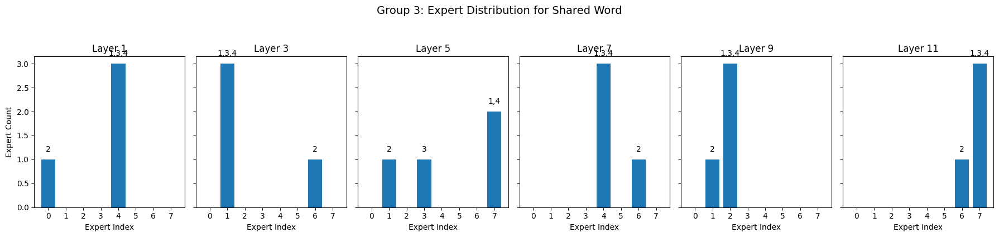

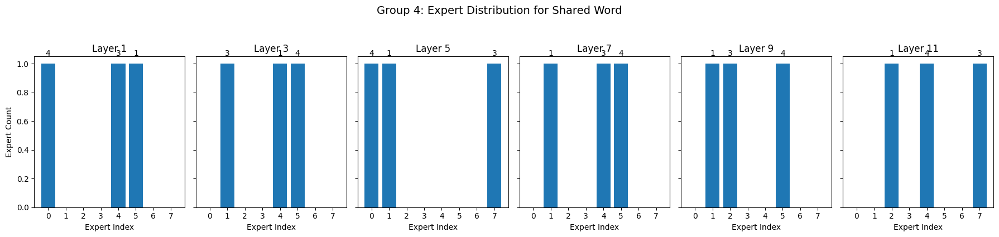

...

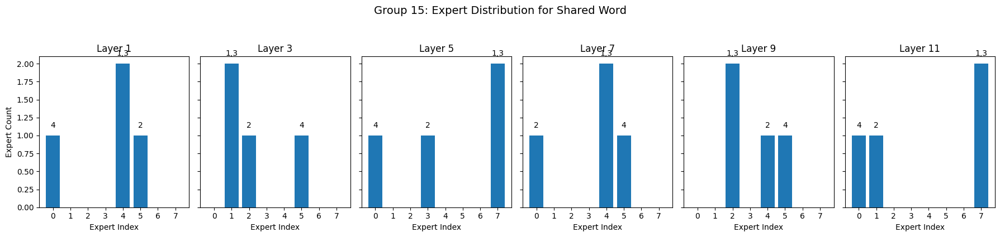

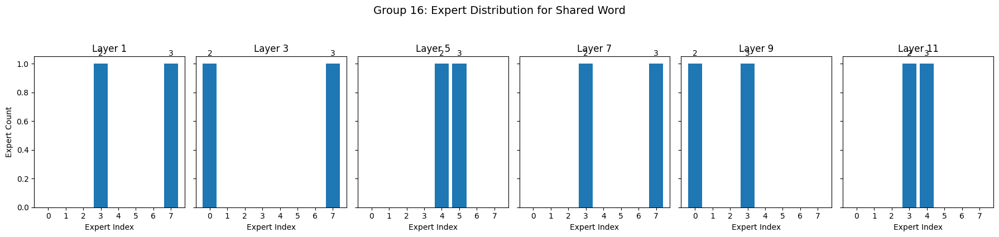

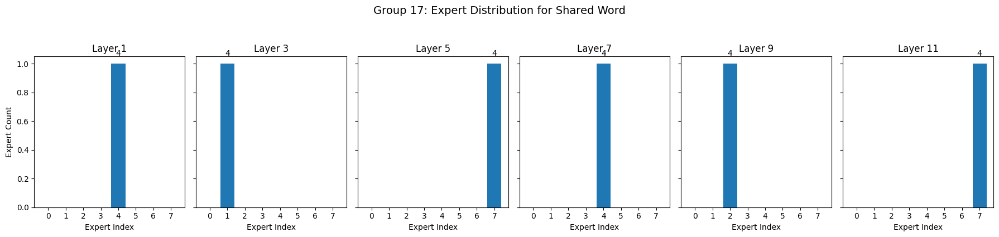

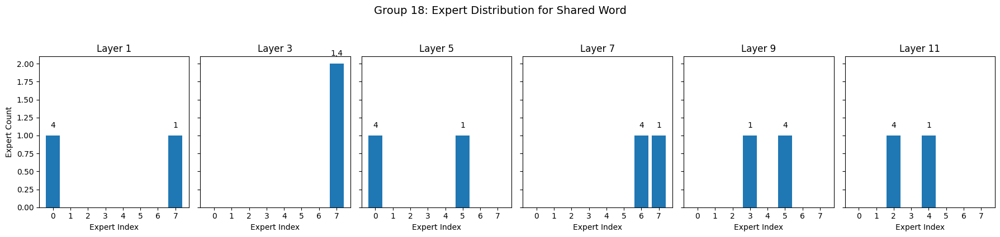

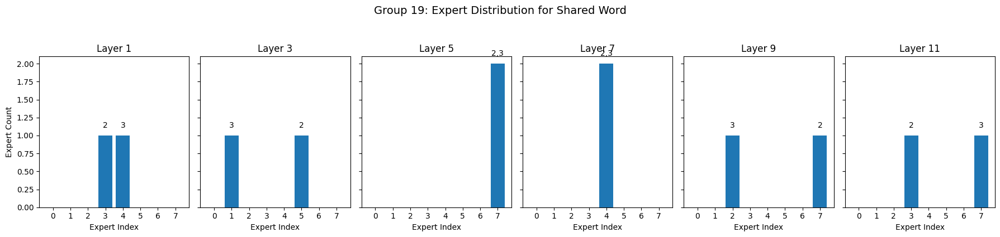

In [33]:
#word intrusion - 10 sentences for a given word in which 9 are using the same sense vs 1 different. is there any relationships between experts and word senses 

# Specify the layers to focus on
target_layers = [1, 3, 5, 7, 9, 11]
num_experts = 8  # Assuming experts are numbered 0-7

def plot_expert_distributions_for_shared_word(data, shared_word_indices):
    num_sentence_groups = max(data.keys()) // 4 + 1

    for group_idx, shared_indices in shared_word_indices.items():
        fig, axs = plt.subplots(1, len(target_layers), figsize=(len(target_layers) * 3, 4), sharey=True)
        fig.suptitle(f'Group {group_idx}: Expert Distribution for Shared Word', fontsize=14, y=1.05)
        
        # Initialize storage for expert routes annotations
        expert_routes = {layer: defaultdict(list) for layer in target_layers}

        for sentence_num, sentence_idx in enumerate(range(group_idx * 4, (group_idx + 1) * 4)):
            word_index = shared_indices[sentence_num]  # Index of the shared word in this sentence
            sentence_data = data[sentence_idx]
            
            for token_key, expert_choices in sentence_data.items():
                if token_key[1] == word_index:  # If this token is the shared word
                    for layer_num, expert_index in expert_choices:
                        if layer_num in target_layers:
                            expert_routes[layer_num][expert_index].append(sentence_num + 1)  # Record sentence number for this expert choice
        
        for i, layer in enumerate(target_layers):
            # Count the occurrences for each expert at this layer
            expert_counts = [len(expert_routes[layer][expert]) for expert in range(num_experts)]
            bars = axs[i].bar(range(num_experts), expert_counts, tick_label=range(num_experts))
            axs[i].set_title(f'Layer {layer}')
            axs[i].set_xlabel('Expert Index')
            if i == 0:
                axs[i].set_ylabel('Expert Count')
            
            # Annotate bars with which sentences were routed to this expert
            for bar, expert in zip(bars, range(num_experts)):
                height = bar.get_height()
                sentence_nums = expert_routes[layer][expert]
                if sentence_nums:  # If any sentences were routed to this expert
                    annotation = ','.join(map(str, sentence_nums))
                    axs[i].annotate(annotation, (bar.get_x() + bar.get_width() / 2, height),
                                    textcoords="offset points", xytext=(0,10), ha='center')

        plt.tight_layout()
        plt.show()

plot_expert_distributions_for_shared_word(int_data, indices_in_sentences)


# Homonyms

In [24]:
def convert_keys(data):
    if isinstance(data, dict):
        new_dict = {}
        for key, value in data.items():
            # Convert the key if it's a string representation of a tuple
            new_key = ast.literal_eval(key) if isinstance(key, str) and key.startswith("('") and key.endswith("')") else key
            new_dict[new_key] = convert_keys(value)  # Recursively apply conversion
        return new_dict
    elif isinstance(data, list):
        return [convert_keys(item) for item in data]  # Apply conversion to each item in list
    else:
        return data  # Return the item unchanged if not a dict or list

# Convert all string tuple keys to actual tuples
converted_data = convert_keys(data)
# Convert string keys to tuple keys
converted_dict = {ast.literal_eval(key): value for key, value in converted_data.items()}
converted_dict

{0: {('▁I', 0, 'PRP'): [[1, 7], [3, 1], [5, 2], [7, 6], [9, 5], [11, 5]],
  ('▁went', 1, 'VBD'): [[1, 4], [3, 4], [5, 1], [7, 6], [9, 1], [11, 6]],
  ('▁to', 2, 'IN'): [[1, 0], [3, 5], [5, 0], [7, 5], [9, 7], [11, 3]],
  ('▁the', 3, 'DT'): [[1, 3], [3, 1], [5, 2], [7, 3], [9, 7], [11, 5]],
  ('▁bank', 4, 'NN'): [[1, 4], [3, 3], [5, 3], [7, 4], [9, 3], [11, 1]],
  ('▁to', 5, 'TO'): [[1, 0], [3, 7], [5, 0], [7, 5], [9, 5], [11, 4]],
  ('▁withdraw', 6, 'VB'): [[1, 6], [3, 4], [5, 0], [7, 6], [9, 7], [11, 2]],
  ('▁money', 7, 'NN'): [[1, 3], [3, 2], [5, 3], [7, 3], [9, 3], [11, 1]],
  ('▁before', 8, 'IN'): [[1, 6], [3, 5], [5, 6], [7, 5], [9, 5], [11, 4]],
  ('▁heading', 9, 'VBG'): [[1, 3], [3, 4], [5, 1], [7, 6], [9, 3], [11, 2]],
  ('▁to', 10, 'IN'): [[1, 0], [3, 5], [5, 0], [7, 5], [9, 7], [11, 3]],
  ('▁the', 11, 'DT'): [[1, 3], [3, 1], [5, 2], [7, 1], [9, 7], [11, 0]],
  ('▁river', 12, 'NN'): [[1, 4], [3, 3], [5, 7], [7, 3], [9, 4], [11, 1]],
  ('▁bank', 13, 'NN'): [[1, 4], [3, 3], [5

In [35]:
# NEXT: look at index division

homonym_experts = []

for i, homonym in enumerate(homonym_sentences.keys()):
    sentence = homonym_sentences[homonym]
    routes = converted_dict[i]
    for key, experts in routes.items():
        word, pos_tag = key[0], key[2]

        if homonym == word[1:]:
            homonym_experts.append([key[0], key[1], key[2], experts])

In [80]:
# Convert data into a DataFrame
df_rows = []
for entry in homonym_experts:
    word, position, pos, values = entry
    # Flatten the list of lists for easier processing
    flattened_values = {f'Index_{value[0]}': value[1] for value in values}
    df_rows.append({'Word': word, 'Position': position, 'POS': pos, **flattened_values})

df = pd.DataFrame(df_rows)

def calculate_similarity(row1, row2, columns):
    match_count = sum(1 for col in columns if row1[col] == row2[col])
    total = len(columns)
    return (match_count / total) * 100 if total > 0 else 0

# Columns to compare
columns_to_compare = ['Index_1', 'Index_3', 'Index_5', 'Index_7', 'Index_9']

# Add a similarity column initialized to None
df['Similarity'] = None
df['Sentence'] = None

# Calculate similarity for every two consecutive rows
for i in range(0, len(df) - 1, 2):  # Assuming data is pairwise as per your structure
    row1 = df.iloc[i]
    row2 = df.iloc[i + 1]
    similarity = calculate_similarity(row1, row2, columns_to_compare)
    df.at[i, 'Similarity'] = similarity
    df.at[i + 1, 'Similarity'] = ""

for i in range(0, len(df), 2):
    try:
        df.at[i, 'Sentence'] = list(homonym_sentences.values())[i]
        df.at[i + 1, 'Sentence'] = ""
    except:
        continue
        

In [81]:
# Set pandas display options
pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.max_colwidth', None)  # Show full content of each cell
pd.set_option('display.width', None)  # Auto-detect the display width for wrapping



In [83]:
list(homonym_sentences.values())

['I went to the bank to withdraw money before heading to the river bank to enjoy the sunset.',
 'He bought a new bat for baseball, not realizing a bat was sleeping in the corner of the garage.',
 "The tree's bark was rough against my back as I listened to the dog bark excitedly in the distance.",
 'While studying about electric current, she felt the strong current pull her as she swam.',
 'I checked the calendar to see the date, wondering if my blind date would enjoy dates as a snack.',
 'They used a single die to decide who would go first, not knowing fate would soon cast a darker die.',
 'After arguing that the weather was fine, he ended up paying a fine for speeding under the clear skies.',
 'They decided to lead the group, unaware of the health risks posed by the lead piping in the building.',
 'After he left the room, I realized the only piece of cake left was his.',
 'She lit the candle with a match, hoping its glow would match the mood she wanted to set.',
 'His intentions were 

In [82]:
# disambugation check between nonMOE and MOE --> tokens routed thru the same path 
# construct task 
#  POSSIBLE difference in later layers 
df.head(80)

,Word,Position,POS,Index_1,Index_3,Index_5,Index_7,Index_9,Index_11,Similarity,Sentence
0,▁bank,4,NN,4,3,3,4,3,1,80.0,I went to the bank to withdraw money before heading to the river bank to enjoy the sunset.
1,▁bank,13,NN,4,3,3,4,6,1,,
2,▁bat,5,NN,4,2,3,3,0,1,60.0,The tree's bark was rough against my back as I listened to the dog bark excitedly in the distance.
3,▁bat,14,DT,4,2,3,0,4,1,,
4,▁bark,4,POS,4,2,3,4,3,1,20.0,"I checked the calendar to see the date, wondering if my blind date would enjoy dates as a snack."
5,▁bark,17,NN,4,4,1,6,5,6,,
6,▁current,4,NN,5,2,3,3,4,1,80.0,"After arguing that the weather was fine, he ended up paying a fine for speeding under the clear skies."
7,▁current,10,JJ,5,2,3,0,4,1,,
8,▁date,7,NN,4,2,3,4,6,1,40.0,"After he left the room, I realized the only piece of cake left was his."
9,▁date,14,JJ,4,3,3,3,4,1,,
